In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import cv2
from scipy.signal import convolve2d
from skimage.io import imread, imshow

In [2]:
sample_img = imread('pexels-jan-kroon-1169107.jpg')

(4000, 6000, 3)
Max pixel value 255


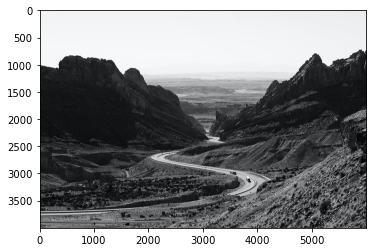

In [3]:
print(sample_img.shape)
print('Max pixel value',sample_img.max())
plt.imshow(sample_img,cmap='gray')

## Contrast enhancement

#### Linear scaling

Max of the given data 255
Max of the scaled data 255.0


Text(0.5, 1.0, 'Filtered image')

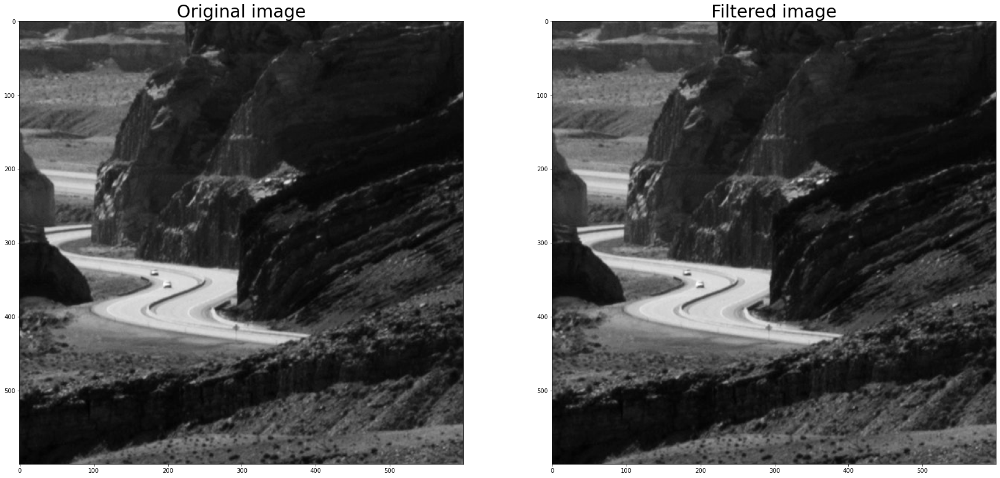

In [4]:
data = sample_img[2000:2600,3000:3600,2]
new_data = 255*((data-data.min())/(data.max()-data.min()))
print('Max of the given data',data.max())
print('Max of the scaled data',new_data.max())
fig,ax = plt.subplots(1,2,figsize=(30,30))
ax[0].imshow(data,cmap='gray')
ax[0].set_title('Original image',fontsize=30)
ax[1].imshow(new_data,cmap='gray')
ax[1].set_title('Filtered image',fontsize=30)

#### Logarithmic scaling
Gives high contrast to the darker colours than the light ones.

Max of the given data 255
Max of the scaled data 255.0


Text(0.5, 1.0, 'Filtered image')

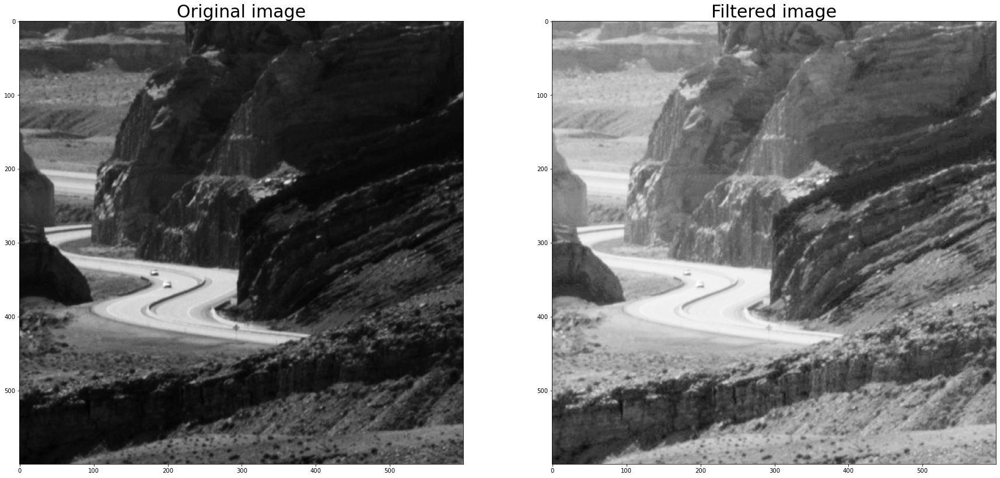

In [5]:
data = sample_img[2000:2600,3000:3600,2]
new_data = np.log(data)
new_data = 255*((new_data-new_data.min())/(new_data.max()-new_data.min()))
print('Max of the given data',data.max())
print('Max of the scaled data',new_data.max())
fig,ax = plt.subplots(1,2,figsize=(30,30))
ax[0].imshow(data,cmap='gray')
ax[0].set_title('Original image',fontsize=30)
ax[1].imshow(new_data,cmap='gray')
ax[1].set_title('Filtered image',fontsize=30)

We can now see more features in the darker regions of the image that was not visible earlier.


#### Exponential contrast enhancing
Will enhance the contrast in the brighter regions than the darker ones.

Max of the given data 255
Max of the scaled data 255.0


Text(0.5, 1.0, 'Filtered image')

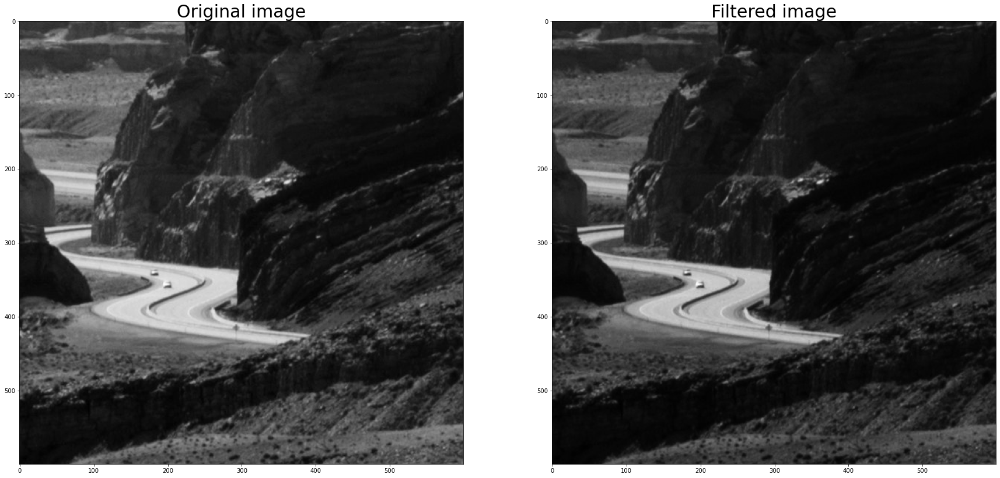

In [6]:
data = sample_img[2000:2600,3000:3600,2]
# Normalize between 0 & 1
new_data = (data-data.min())/(data.max()-data.min())
new_data = np.exp(new_data)
# Normalize between 0 & 255
new_data = 255*((new_data-new_data.min())/(new_data.max()-new_data.min()))
print('Max of the given data',data.max())
print('Max of the scaled data',new_data.max())
fig,ax = plt.subplots(1,2,figsize=(30,30))
ax[0].imshow(data,cmap='gray')
ax[0].set_title('Original image',fontsize=30)
ax[1].imshow(new_data,cmap='gray')
ax[1].set_title('Filtered image',fontsize=30)

#### Polynomial contrast enhancing x^n

Max of the given data 255
Max of the scaled data 255.0
Max of the scaled data 255.0


Text(0.5, 1.0, 'Power x=0.25')

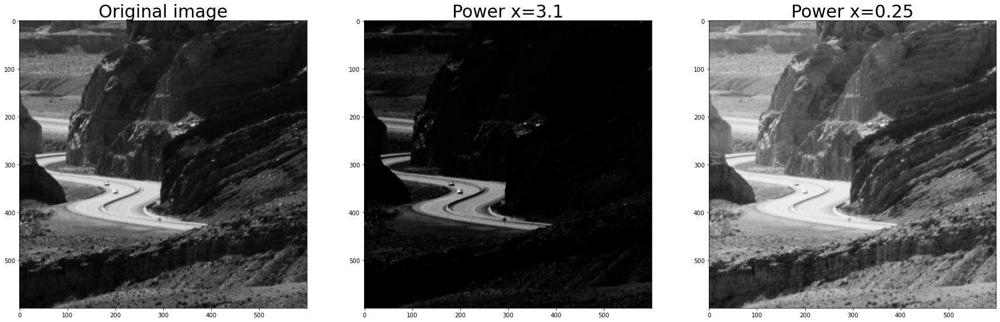

In [7]:
data = sample_img[2000:2600,3000:3600,2]
x1,x2 = 3.1,0.25
new_data = (data)**x1
new_data1= data**x2
new_data = 255*((new_data-new_data.min())/(new_data.max()-new_data.min()))
new_data1 = 255*((new_data1-new_data1.min())/(new_data1.max()-new_data1.min()))
print('Max of the given data',data.max())
print('Max of the scaled data',new_data.max())
print('Max of the scaled data',new_data1.max())
fig,ax = plt.subplots(1,3,figsize=(30,30))
ax[0].imshow(data,cmap='gray')
ax[0].set_title('Original image',fontsize=30)
ax[1].imshow(new_data,cmap='gray')
ax[1].set_title(f'Power x={x1}',fontsize=30)
ax[2].imshow(new_data1,cmap='gray')
ax[2].set_title(f'Power x={x2}',fontsize=30)

As we can see for exponents greater than 1 the contrast is enhanced for lighter regions and for exponents less than 1 darker regions gets enhanced.

#### Polynomial contrast enhancing (1/x)^n

Max of the given data 255
Max of the scaled data 255.0
Max of the scaled data 255.0


Text(0.5, 1.0, 'Power x=0.25')

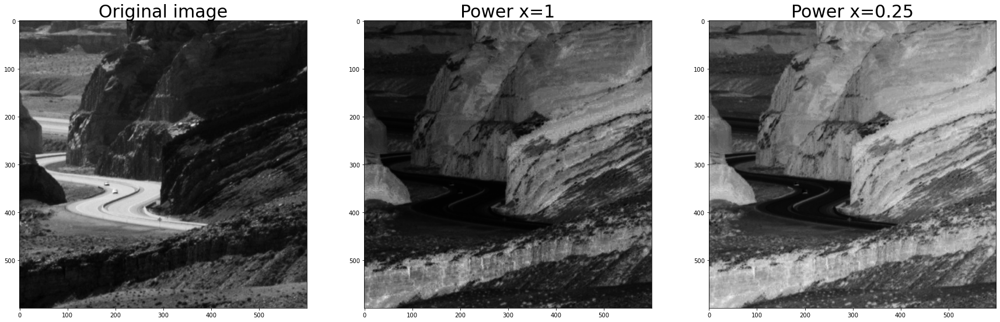

In [8]:
data = sample_img[2000:2600,3000:3600,2]
x1,x2 = 1,0.25
new_data = 1/(data)**x1
new_data1= 1/data**x2
new_data = 255*((new_data-new_data.min())/(new_data.max()-new_data.min()))
new_data1 = 255*((new_data1-new_data1.min())/(new_data1.max()-new_data1.min()))
print('Max of the given data',data.max())
print('Max of the scaled data',new_data.max())
print('Max of the scaled data',new_data1.max())
fig,ax = plt.subplots(1,3,figsize=(30,30))
ax[0].imshow(data,cmap='gray')
ax[0].set_title('Original image',fontsize=30)
ax[1].imshow(new_data,cmap='gray')
ax[1].set_title(f'Power x={x1}',fontsize=30)
ax[2].imshow(new_data1,cmap='gray')
ax[2].set_title(f'Power x={x2}',fontsize=30)

It has an inverting effect, the dark regions are changed to light and vice versa

## Filtering using convolution

In [9]:
# Function for performing convolution and printing the filtered image beside the original
def convolve(data,kernel,invert=0,pow=1,norm=0):
    if np.sum(kernel)!=0:
        img = ((convolve2d(data,kernel , 'valid'))/(abs(np.sum(kernel))))**pow
        img = np.around(img)
    else:
        img = ((convolve2d(data,kernel , 'valid'))/(1))**pow
        img = np.around(img)
    # normalizing linear max value of output will be same as the max of the input data
    if norm==1:
        img = (data.max())*((img-img.min())/(img.max()-img.min()))
        img = np.around(img)
    print('             Max Min Mean Median')
    print('Before filter',data.max(),' ',data.min(),' ',data.mean(),'   ',np.median(data))
    print('After filter:',img.max(),' ',img.min(),' ',img.mean(),'   ',np.median(img))
    fig,ax = plt.subplots(1,2,figsize=(32,32))
    ax[0].imshow(data,cmap='gray')
    ax[0].set_title('Original image',fontsize=30)
    ax[1].imshow(img,cmap='gray')
    ax[1].set_title('Filtered image',fontsize=30)
    plt.show()
    return img

In [10]:
d = np.array([2,8,6,6,6,2,8,6,6,6,2,2,8,6,6,2,2,2,8,6,2,2,2,2,8])
d = d.reshape(5,5)
d

array([[2, 8, 6, 6, 6],
       [2, 8, 6, 6, 6],
       [2, 2, 8, 6, 6],
       [2, 2, 2, 8, 6],
       [2, 2, 2, 2, 8]])

             Max Min Mean Median
Before filter 8   2   4.64     6.0
After filter: 8.0   0.0   3.888888888888889     4.0


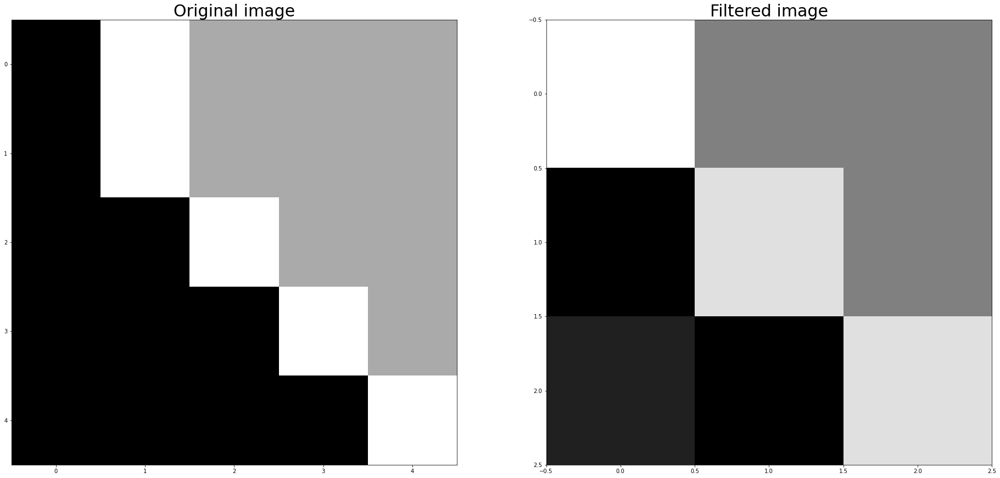

array([[8., 4., 4.],
       [0., 7., 4.],
       [1., 0., 7.]])

In [11]:
kernel = [[-1,-1,-1],[-1,16,-1],[-1,-1,-1]]
# img = convolve(d,kernel)
img = convolve(d,kernel,norm=1)
img

In [12]:
img**2


array([[64., 16., 16.],
       [ 0., 49., 16.],
       [ 1.,  0., 49.]])

In [13]:
img**1.9

array([[51.98415337, 13.92880901, 13.92880901],
       [ 0.        , 40.33539145, 13.92880901],
       [ 1.        ,  0.        , 40.33539145]])

In [14]:
data=sample_img[2000:2600,3000:3600,2]

#### Low pass

In [15]:
k_low = [[0.11111,0.11111,0.11111],[0.11111,0.11111,0.11111],[0.11111,0.11111,0.11111]]

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 250.0   16.0   68.27501370230758     53.0


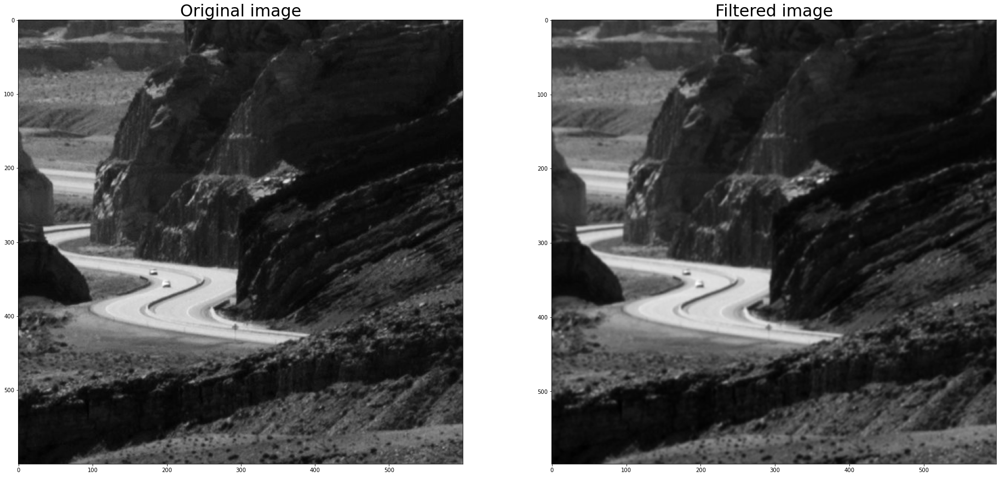

array([[ 67.,  67.,  66., ...,  68.,  65.,  60.],
       [ 66.,  66.,  66., ...,  65.,  57.,  50.],
       [ 65.,  66.,  66., ...,  58.,  49.,  44.],
       ...,
       [ 22.,  22.,  23., ..., 101., 107., 109.],
       [ 22.,  22.,  23., ..., 102., 109., 114.],
       [ 22.,  22.,  23., ..., 102., 110., 115.]])

In [16]:
convolve(data,k_low)

#### High pass

In [17]:
k_high = [[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 255.0   0.0   106.41005973087549     106.0


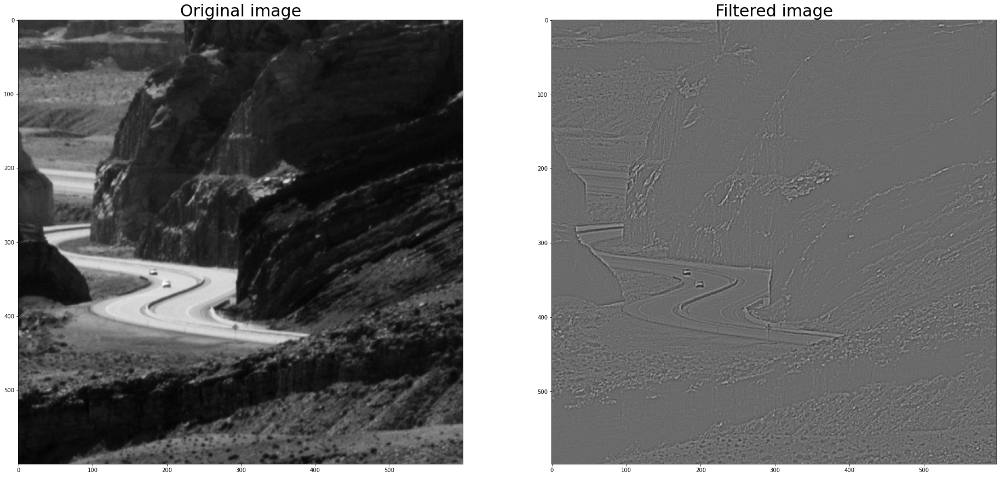

In [18]:
img = convolve(data,k_high,norm=1)

#### Laplace edge enhancement

In [19]:
k_enh = [[0,-1,0],[-1,4,-1],[0,-1,0]]

In [20]:
img = abs(convolve2d(sample_img[2000:2600,3000:3600,2],k_enh , 'valid'))

print('Before filter',sample_img[2000:2600,3000:3600,2].max(),sample_img[2000:2600,3000:3600,2].min())
print('After filter:',img.max(),img.min(),np.median(img))

Before filter 255 14
After filter: 148 0 4.0


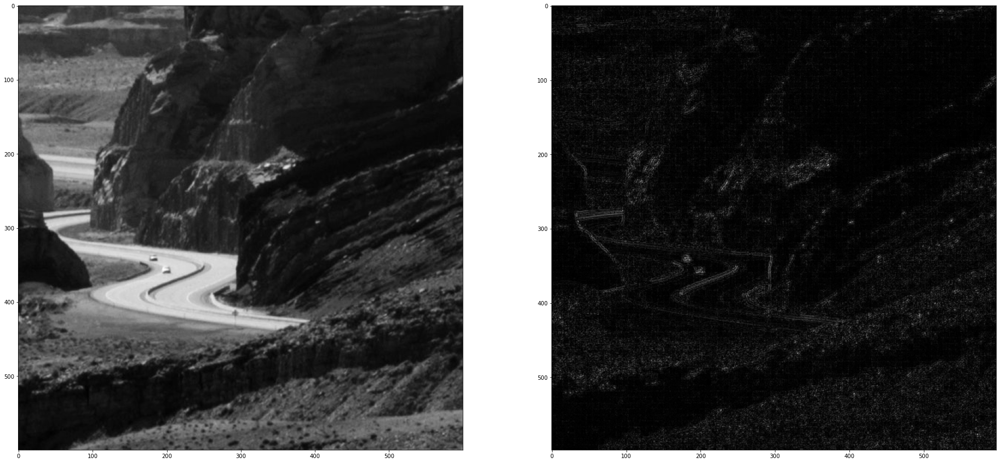

In [21]:
fig,ax = plt.subplots(1,2,figsize=(32,32))
ax[0].imshow(sample_img[2000:2600,3000:3600,2],cmap='gray')
ax[1].imshow(img,cmap='gray')

#### Laplace Edge enhacement:Sharpening filter
Background is not lost, sharpens the edges

In [22]:
k_sharp = [[0,-1,0],[-1,5,-1],[0,-1,0]]

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 255.0   0.0   73.33411259381886     61.0


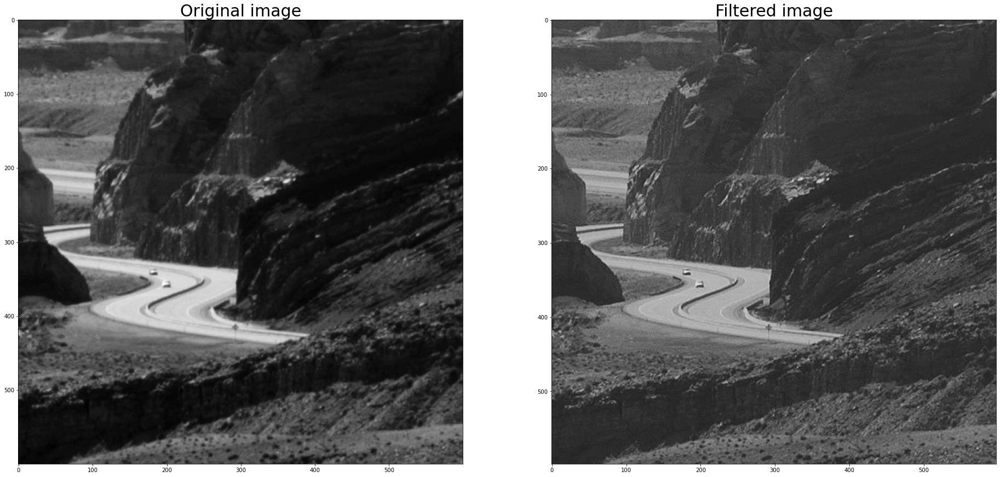

255.0 0.0
255 2


In [23]:
img=convolve(data,k_sharp,norm=1)
print(img.max(),img.min())
print(sample_img[:,:,2].max(),sample_img[:,:,2].min())

In [24]:
k_edetect = [[1,0,-1],[1,0,-1],[1,0,-1]] #prewitt vertical

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 329.0   -409.0   -0.11613684410688918     0.0


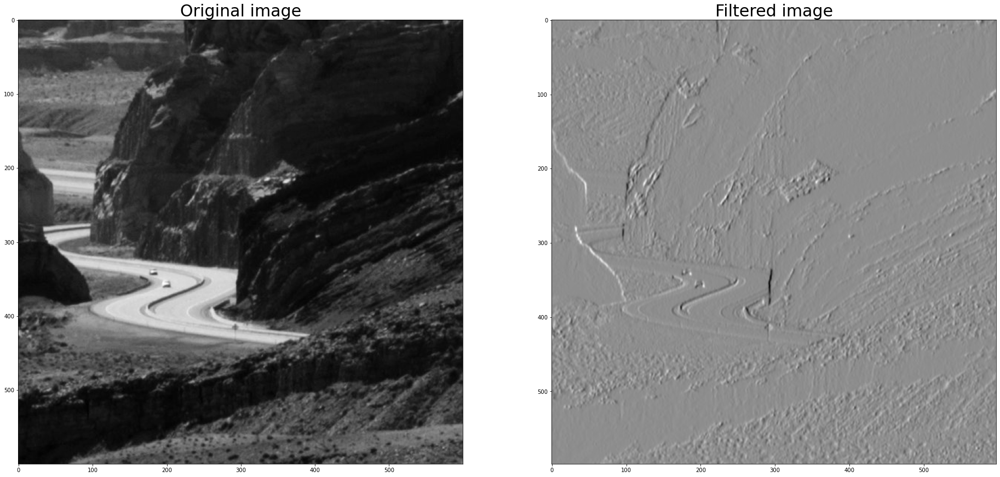

In [25]:
img=convolve(data,k_edetect)

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 447.0   -551.0   -0.15486963233073456     0.0


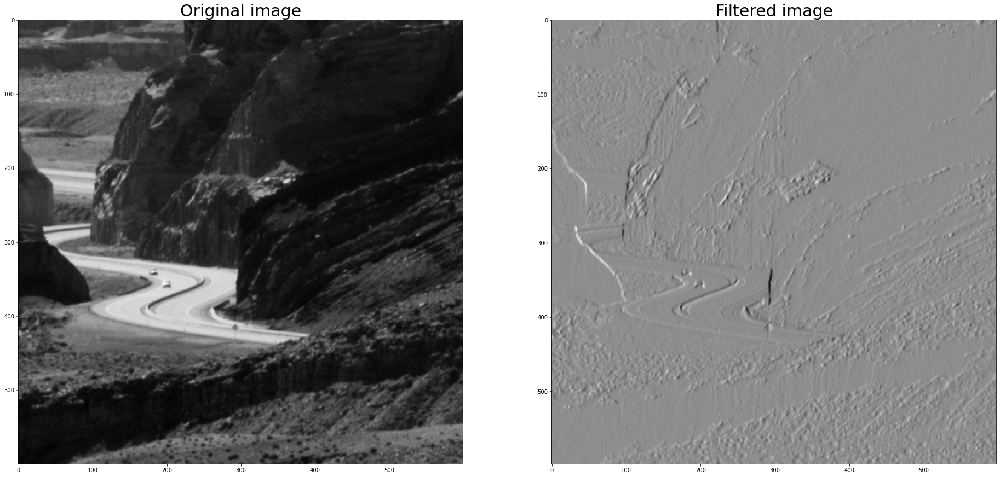

In [39]:
k_edetect = [[1,0,-1],[2,0,-2],[1,0,-1]] #sobel vertical
img=convolve(data,k_edetect)

#### Vertical edge detection

In [26]:
k_vert = [[0,0,0],[-1,1,0],[0,0,0]]

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 80.0   -70.0   0.01991868099909397     0.0


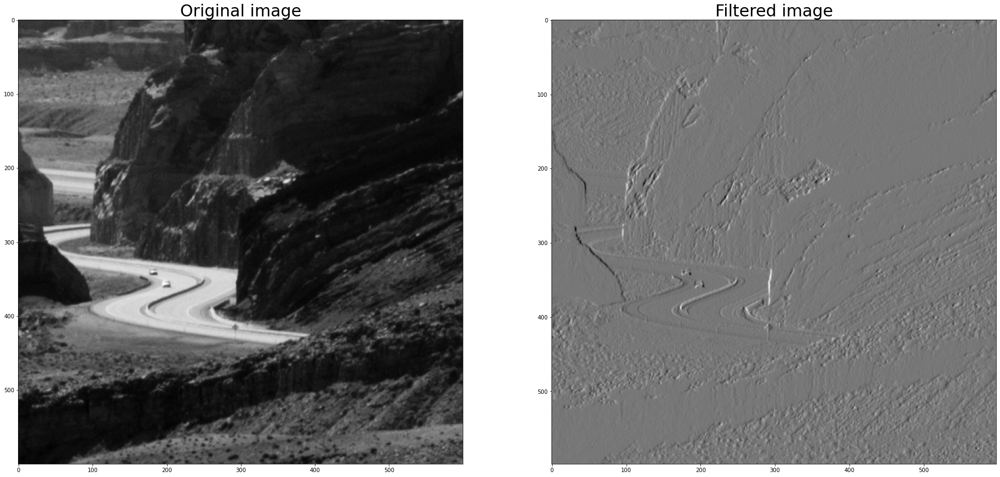

In [27]:
img=convolve(sample_img[2000:2600,3000:3600,2],k_vert)

#### Horizontal Edge detection (asymmetric filter)

In [28]:
k_ehance = [[0,-1,0],[0,1,0],[0,0,0]]

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 255.0   0.0   119.62393877025984     120.0


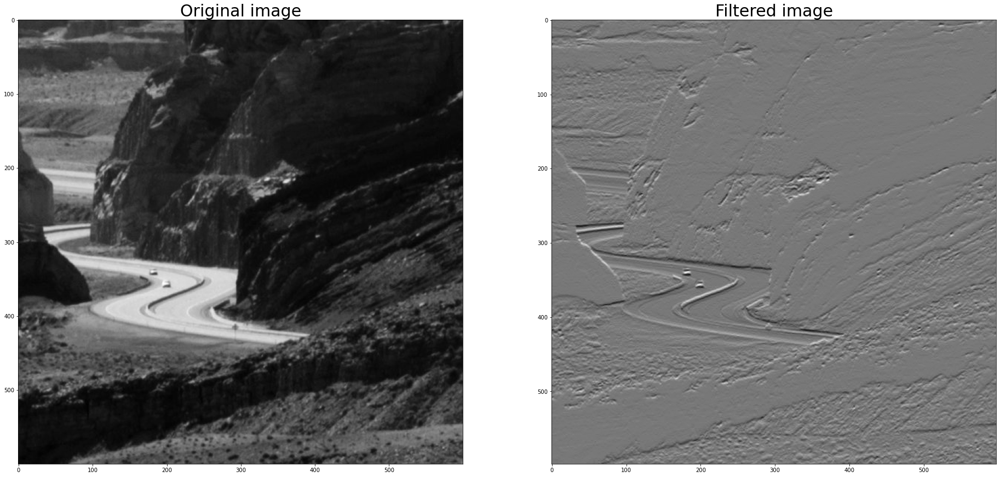

In [29]:
img = convolve(data,k_ehance,pow=1,norm=1)

In [30]:
k_emboss = [[-2,-1,0],[-1,1,1],[0,1,2]] #skew-symmetric kernel

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 255.0   0.0   98.60150333888883     94.0


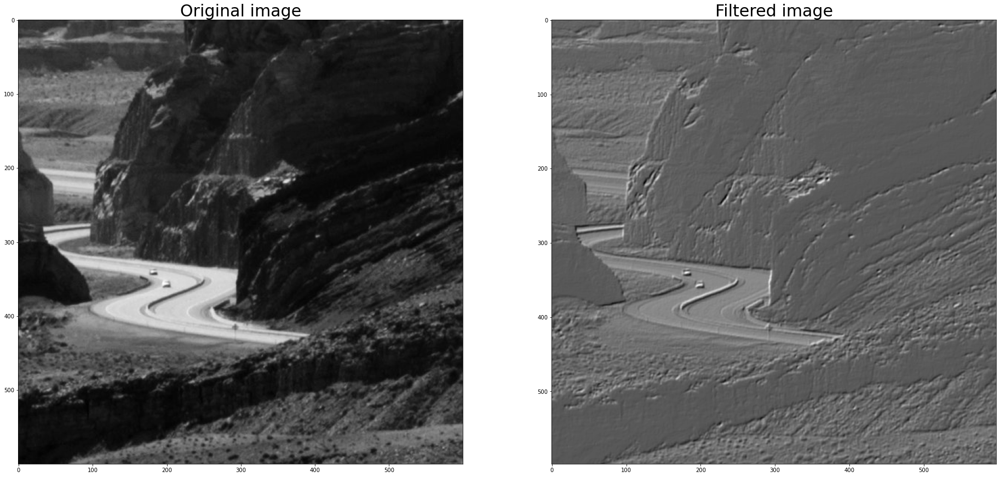

In [31]:
img = convolve(data,k_emboss,pow=1,norm=1)

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 314.0   -381.0   0.14130994060469124     0.0


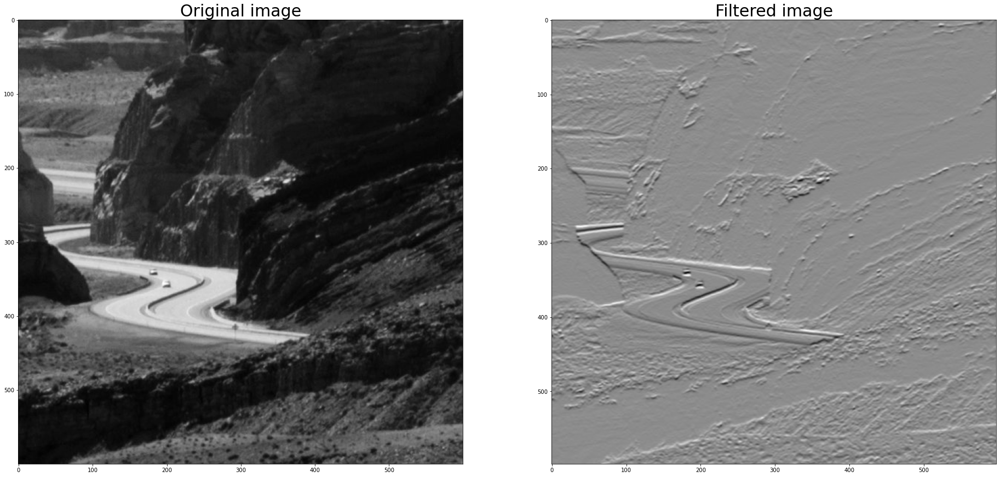

In [40]:
k_edetect = [[1,1,1],[0,0,0],[-1,-1,-1]] #prewitt horizontal
img=convolve(data,k_edetect)

             Max Min Mean Median
Before filter 255   14   68.25078333333333     53.0
After filter: 420.0   -509.0   0.18841511839912306     0.0


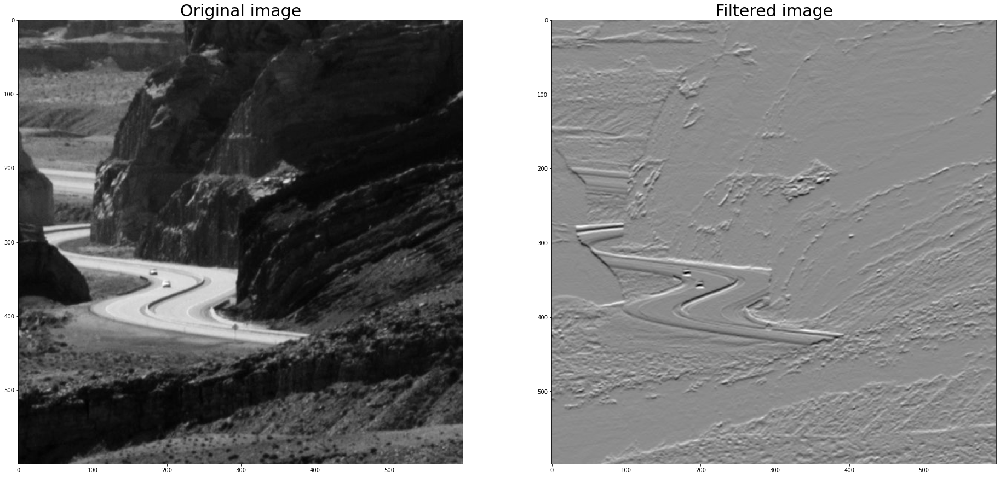

In [41]:
k_edetect = [[1,2,1],[0,0,0],[-1,-2,-1]] #sobel horizontal
img=convolve(data,k_edetect)

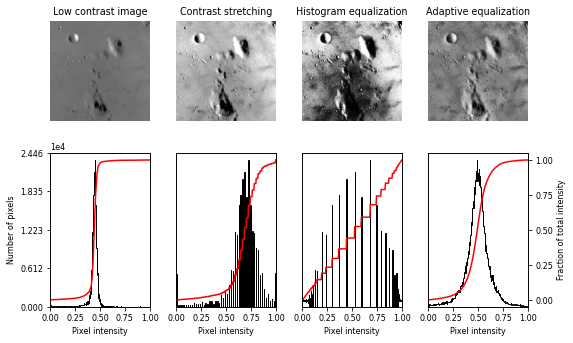

In [42]:


#Low contrast image, Contrast stretching, Histogram equalization, Adaptive equalization
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import data, img_as_float
from skimage import exposure


matplotlib.rcParams['font.size'] = 8


def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf


# Load an example image
img = data.moon()

# Contrast stretching
p2, p98 = np.percentile(img, (2, 98))
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

# Equalization
img_eq = exposure.equalize_hist(img)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

# Display results
fig = plt.figure(figsize=(8, 5))
axes = np.zeros((2, 4), dtype=object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:, 1])
ax_img.set_title('Contrast stretching')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 2])
ax_img.set_title('Histogram equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 3])
ax_img.set_title('Adaptive equalization')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()
